# Analyze Airbnb in New York City

# Table of contents

* [I. Important notebook instruction](#Important_notebook_instruction)
* [II. Introduction](#Introduction)
* [III. Research questions](#Research_questions)
* [IV. Dataset](#Dataset)
    * [1. Scraping the data](#1_Scraping_the_data)
    * [2. Describing the data](#2_Describing_the_data)
    * [3. Cleaning the data](#3_Cleaning_the_data)
        * [Airbnb data](#Airbnb_data)
        * [NTA data](#NTA_data)
        * [Airbnb_NTA data](#Airbnb_NTA_data)
* [V. Data visualization](#Data_visualization)
    * [1. Visualizing the correlation between demographic variables](#1_Visualizing)
    * [2. Visualizing Airbnb Data at NTA and Borough Level](#2_Visualizing)
    * [3. Visualizing the relationship between Airbnb variables and demographic variables](#3_Visualizing)
* [VI. PCA](#PCA)
    * [1. Dimension Reduction for Demographic Data across Different Boroughs](#1_PCA_Demographic_Data_across_different_Borough)
    * [2. Dimension Reduction for Airbnb Data across Different Boroughs](#2_PCA_Airbnb_Data_among_different_Borough)
* [VII. Conclusion](#Conclusion)
* [VIII. Appendix](#Appendix)

# I. Important notebook instruction <a class="anchor" id="Important_notebook_instruction"></a>

In order to run all cells in this project, there are some neccessary modules which are listed below that need to be run at the beginning. Besides, 3 addtional modules need to be installed, which are:

1. Plotly (pip install folium plotly==5.5.0)
2. matplotlib-scalebar (pip install matplotlib-scalebar)
3. U mapclassify (pip install -U mapclassify)

In [1]:
# Import neccessary modules

import geopandas as gpd
import gzip
import numpy as np
import pandas as pd
import requests
import shutil
import tempfile
import urllib.request
import zipfile

from geopandas import GeoDataFrame
from shapely.geometry import Point

from plotly.subplots import make_subplots
import plotly.graph_objects as go

import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns
sns.reset_orig()

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# II. Introduction<a class="anchor" id="Introduction"></a>

Airbnb has become an increasingly popular choice of accommodations for those traveling due to the growth of the sharing economy. New York, as a touristy developed city, owns a great number of Airbnb housings. The distribution, characteristics, and link of Airbnb in New York City with other features are all interesting issues to investigate. In this perspective, I will study two datasets in this project: the Airbnb dataset and the New York City demography dataset.

I start by scraping these two datasets from the website 'Inside Airbnb' and 'GeoDa Data and Lab' respectively. The 'Inside Airbnb' website periodically publishes snapshots of Airbnb listings around the world. I use the detailed listings data for New York City. The raw dataset describes 37,714 observations and 74 variables and was collected between April to November 2021. The NYC demography dataset contains 195 observations and 98 variables. The dataset is collected from the American Community Survey (ACS) by the U.S. Census Bureau. It contains the demographic information for New York City neighborhoods at the NTA level from 2008 to 2012.


# III. Research questions<a class="anchor" id="Research_questions"></a>

In this project, I aim to explore three main questions:

- How are Airbnb listings distributed in NYC?
- What is the relationship within and between demographic features and Airbnb listings?
- What are the spatial relationships of demographic features and Airbnb listings within Boroughs?

To answer the first question, I will utilize interactive maps and choropleth maps to visualize the distribution of Airbnb listings in NYC.

For the second question, I will examine the correlation between demographic variables using heatmaps. Additionally, I will explore correlations between demographic characteristics and Airbnb variables using scatter plots and histograms.

To address the third question, I will employ Principal Component Analysis (PCA) to group demographic and Airbnb variables and assess whether these variables can be clustered effectively based on specific criteria or goals.


# IV. Dataset<a class="anchor" id="Dataset"></a>

## 1. Scraping the data<a class="anchor" id="1_Scraping_the_data"></a>

In [2]:
# Scarping the Airbnb data by url

AirbnbURL = "http://data.insideairbnb.com/united-states/ny/new-york-city/2021-11-02/data/listings.csv.gz"
urllib.request.urlretrieve(AirbnbURL, "listing.csv.gz")
with gzip.open('listing.csv.gz', 'rb') as f_in:
    with open('listing.csv', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)
        
airbnb = pd.read_csv('listing.csv',low_memory=False)
airbnb.head(4)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20211102175544,2021-11-03,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,...,4.79,4.86,4.41,NaN,f,3,3,0,0,0.33
1,3831,https://www.airbnb.com/rooms/3831,20211102175544,2021-11-03,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,...,4.81,4.72,4.65,NaN,f,1,1,0,0,4.91
2,5121,https://www.airbnb.com/rooms/5121,20211102175544,2021-11-03,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,...,4.91,4.47,4.52,NaN,f,2,0,2,0,0.53
3,5136,https://www.airbnb.com/rooms/5136,20211102175544,2021-11-03,"Spacious Brooklyn Duplex, Patio + Garden",We welcome you to stay in our lovely 2 br dupl...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,7378,https://www.airbnb.com/users/show/7378,...,5.00,4.50,5.00,NaN,f,1,1,0,0,0.02


In [3]:
# Scraping the NYC demographic data by url

def get_data():
    url = "https://geodacenter.github.io/data-and-lab/data/nycnhood_acs.zip"
    response = requests.get(url)
    return url, response.content


if __name__ == '__main__':
    url, data = get_data()  

    _tmp_file = tempfile.TemporaryFile()  
    print(_tmp_file)

    _tmp_file.write(data) 
    

    zf = zipfile.ZipFile(_tmp_file, mode='r')
    for names in zf.namelist():
        f = zf.extract(names, './zip')  
        print(f)

    zf.close()
    
NTA = gpd.read_file("zip/NYC_Nhood ACS2008_12.shp")
NTA.head(4)

<_io.BufferedRandom name=62>
zip/NYC_Nhood ACS2008_12.dbf
zip/__MACOSX
zip/__MACOSX/._NYC_Nhood ACS2008_12.dbf
zip/NYC_Nhood ACS2008_12.prj
zip/__MACOSX/._NYC_Nhood ACS2008_12.prj
zip/NYC_Nhood ACS2008_12.shp
zip/__MACOSX/._NYC_Nhood ACS2008_12.shp
zip/NYC_Nhood ACS2008_12.shx
zip/__MACOSX/._NYC_Nhood ACS2008_12.shx


,UEMPRATE,cartodb_id,borocode,withssi,withsocial,withpubass,struggling,profession,popunemplo,poptot,...,boroname,popdty,ntacode,medianinco,medianagem,medianagef,medianage,HHsize,gini,geometry
0,0.095785,1,3,652,5067,277,6421,889,2225,48351,...,Brooklyn,497498.701,BK45,1520979,663.3,777.1,722.6,2.96421052631579,0.386315789473684,"POLYGON ((-73.91716 40.63173, -73.91722 40.631..."
1,0.090011,2,3,2089,7132,1016,10981,1075,2652,61584,...,Brooklyn,589296.926,BK17,1054259,791.4,868.5,827.6,2.46578947368421,0.448089473684211,"POLYGON ((-73.91809 40.58657, -73.91813 40.586..."
2,0.130393,3,3,3231,8847,2891,21235,712,6483,100130,...,Brooklyn,1506628.84,BK61,980637,863.1,983.9,923.8,2.42925925925926,0.473666666666667,"POLYGON ((-73.92165 40.67887, -73.92171 40.678..."
3,0.086633,4,3,1103,3508,553,7188,475,1709,33155,...,Brooklyn,468975.876,BK90,519058,333.6,350.1,341.3,2.189,0.44139,"POLYGON ((-73.92406 40.71411, -73.92404 40.714..."


## 2. Describing the data<a class="anchor" id="2_Describing_the_data"></a> 

### Visualize New York City Neighborhood Tabulation Areas

New York City (NYC) is distinguished for its unique neighborhood division. It is separated into five boroughs: Bronx, Brooklyn, Manhattan, Queens, and Staten Island. All these five boroughs togetherly made up this diverse economic and cultural metropolis in the United State. 

However, the borough is still quite large when I want to have a better understanding of neighborhoods throughout New York City. Hence, the Department of New York City Planning combined census data with New York City's fifty-five Public Use Microdata Areas (PUMAs) and created Neighborhood Tabulation Areas(NTAs) for more detailed division. These medium-sized geographic areas subset the whole city into 195 small blocks, which could better guide urban policymaking process in New York City.

In [4]:
# Count the number of NTAs in New York City 

NTA['ntaname'].describe()

count                  195
unique                 195
top       Sunset Park East
freq                     1
Name: ntaname, dtype: object

In [5]:
# Display the list of neighborhood tabulation areas and their belonging boroughs

ntaboroughgeo = NTA[['boroname','ntaname']]
ntaboroughgeo = ntaboroughgeo.rename(columns={'ntaname': 'Neighborhood Tabulation Areas', 'boroname': 'Borough'})
ntaboroughgeo = ntaboroughgeo.sort_values(by = 'Borough', ignore_index=True)
#ntaboroughgeo.style.hide_index()
ntaboroughgeo.head(4).style.hide_index() #We list four NTAs as examples

Borough,Neighborhood Tabulation Areas
Bronx,Parkchester
Bronx,Van Nest-Morris Park-Westchester Square
Bronx,Claremont-Bathgate
Bronx,Westchester-Unionport


In [6]:
# Visualize the distribution of neighborhood tabulation areas in each boroughs

boro_num = ntaboroughgeo.groupby(['Borough']).size().reset_index(name='Counts')
size=boro_num['Counts']

fig = go.Figure(data=[go.Scatter(
    x=boro_num['Borough'], y=boro_num['Counts'],
    mode='markers',
    marker=dict(
        color=['rgb(93, 164, 214)', 'rgb(255, 144, 14)',  'rgb(44, 160, 101)', 'rgb(255, 65, 54)','rgb(31, 17, 17)'],
        size=boro_num['Counts'],
        sizemode='area',
        sizeref=1.*max(size)/(70.**2),
        sizemin=4
    )
)])

fig.update_layout(
    title='The Number of Neighborhood Tabulation Areas in Each Boroughs',
    xaxis=dict(title='New York City Borough'),
    yaxis=dict(title='Number of NTA')
)

fig.show()

According to the statistics above, there is a total number of 195 neighborhood tabulation areas in New York City.
The bubble chart effectively compares the number of neighborhood tabulation areas among five boroughs. We can see that: Queens has the highest amount of neighborhood tabulation areas(58), whereas Staten Island has the smallest number(19) of neighborhood tabulation areas. Brooklyn, Bronx, and Manhattan have 51, 38, and 29 NTAs respectively.

In [7]:
# Use interactive map to visualize how NTAs locate in boroughs

NTA.explore(
     column="boroname", 
     tooltip="ntaname", 
     popup=True, 
     tiles="CartoDB positron", 
     cmap="Set1", 
     style_kwds=dict(color="black") 
    )

The interactive map gives us a direct visualization of neighborhood tabulation areas in the city. Queens still ranks at the top when calculating the land area of each Borough. The second largest Borough is Brooklyn, followed by Staten Island. Bronx and Manhattan is the fourth and fifth largest Borough. I then use these NTA data together with Airbnb data for further visualization. 

## 3. Cleaning the data<a class="anchor" id="3_Cleaning_the_data"></a>

### Airbnb data<a class="anchor" id="Airbnb_data"></a>

After scrapping the airbnb data from the website, I clean this dataset by the following steps:

1. Drop some variables such as the url linking and scarpe id, which are unrelated to the purposes of this analysis.
2. Convert the percentage number representations of "host response rate" to float.
3. Convert the currency string of "price" to float

In [8]:
# Drop unrelated columns in airbnb dataset

airbnb = airbnb.drop(['listing_url', 'scrape_id', 'last_scraped','neighborhood_overview', 'picture_url', 'host_url',
       'host_name', 'host_since',
       'host_response_time', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'bathrooms', 'amenities', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'calendar_last_scraped', 'first_review',
       'last_review', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'license', 'instant_bookable',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month'], axis=1)

# Convert the data types into numeric format
airbnb['host_response_rate'] = airbnb['host_response_rate'].str.rstrip('%').astype('float') / 100.0
airbnb['price'] = airbnb['price'].replace({'\$': '', ',': ''}, regex=True).astype(float)
airbnb=airbnb.dropna()

### NTA data<a class="anchor" id="NTA_data"></a>

As I mention in the last section, this dataset contains demographic information about New York City (NYC) at NTA (the neighborhoods in NYC) level, thus I name this dataframe as 'NTA'.

I first investigate the 'ntaname' column, which refers to the name for Neighborhood Tabulation Area, and find there are some names such as the park and airport whose existence is unjustified because there should not have Airbnb housings appearing in these places. Therefore, I drop the observations whose 'ntaname' contains words 'Park or 'Airport'.

As I want to use all demographic features in this dataset, I need to make sure all variables are numeric. So, I convert 7 columns from object to float.

In [9]:
# Check the NTA name in NTA dataset

NTA.ntaname.head(4) #List 4 ntanames as examples

0    Georgetown-Marine Park-Bergen Beach-Mill Basin
1    Sheepshead Bay-Gerritsen Beach-Manhattan Beach
2                               Crown Heights North
3                                 East Williamsburg
Name: ntaname, dtype: object

In [10]:
# Drop the observations whose ntamname contains park or airport

NTA=NTA[~NTA.ntaname.str.contains("Park|Airport")]

In [11]:
# Convert the data type into numeric format

cols = ['popdty', 'medianinco', 'medianagem','medianagef', 'medianage', 'HHsize','gini']
NTA[cols] = NTA[cols].apply(pd.to_numeric, errors='coerce', axis=1)
NTA=NTA.dropna()

### Airbnb_NTA data<a class="anchor" id="Airbnb_NTA_data"></a>

Before implementing the last step of data cleaning, I need to merge these two datasets. Since I am combining two geopandas dataframes, I need to reproject these two geodataframe into the same CRS(Coordinates Reference System) first. I choose "EPSG:32118" because it refers to the New York Long Island and thus ensures that the map can be projected correctly.

Since the main Airbnb features I focus on are price, the number of reviews, our data cleaning will primarily focus on dropping the outliers of these two variables. The other main feature I focus on is the number of Airbnb housings, which will be calculated later.

In [12]:
# Change the CRS of both datasets

NTA = NTA.to_crs("EPSG:32118")
geometry = [Point(xy) for xy in zip(airbnb.longitude, airbnb.latitude)] #Transfer the airbnb dataframe into geodataframe
Airbnb_sf = GeoDataFrame(airbnb, crs="EPSG:4326", geometry=geometry)
Airbnb_sf=Airbnb_sf.to_crs("EPSG:32118")
Airbnb_NTA=gpd.sjoin(NTA,Airbnb_sf) #spatial join datasets

In [13]:
# Drop the outliers of "number of reviews" and "price"

cols = ['number_of_reviews', 'price']

Q1 = Airbnb_NTA[cols].quantile(0.25)
Q3 = Airbnb_NTA[cols].quantile(0.75)
IQR = Q3 - Q1

df = Airbnb_NTA[~((Airbnb_NTA[cols] < (Q1 - 1.5 * IQR)) |(Airbnb_NTA[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [14]:
# Visualize and compare the dataset before and after dropping the outliers by Plotly

fig = make_subplots(rows=2, cols=2)

fig.add_trace(go.Box(
            name="Price with ourliers",
            y=Airbnb_NTA["price"],
        ),
        row=1, col=1
)
fig.add_trace(go.Box(
            name="Number of reviews with outliers",
            y=Airbnb_NTA["number_of_reviews"],
        ),
        row=1, col=2
)
fig.add_trace(go.Box(
            name="Price without ourliers",
            y=df["price"],),row=2, col=1)

fig.add_trace(go.Box(
            name="Number of reviews without outliers",
            y=df["number_of_reviews"]), 
        row=2, col=2
)

fig.update_layout(title_text="Compared Original and Cleansed Data in Box Plots")
fig.show()

The box plots above compare the "price" and "number of reviews" before and after excluding the outliers respectively. It is evident that the outliers have been clearly reduced in the lower two box plots.

# V. Data visualization<a class="anchor" id="Data_visualization"></a>

## 1. Visualizing the correlation between demographic variables<a class="anchor" id="1_Visualizing"></a>

These two heatmaps are both based on the NTA data. This demographic data includes an elaborate list of variables and covers all neighborhood tabulation areas in NYC. The variables can generally be separated into five groups: basic demographic information, socio-economic indicators, educational background, working conditions, and ethnic distribution.

The first heatmap visualizes all correlation relationships in the NTA data, whereas the second heatmap only selects 12 important variables for detailed illustration. I mainly select three groups of data: economic (living) conditions, educational background, and ethnic demographics. It is clear to see that the economic condition of a citizen is strongly correlated with their educational level. People who have achieved a Master's degree are unlikely to struggle or be poor. Citizens who have a high school diploma or above have a greater chance to live okay. However, people who did not attend high school are strongly likely to be poor or struggle in society. This heatmap also shows some other interesting correlations. For example, the population of Hispanic Americans is positively correlated with poor economic conditions and low educational levels. African Americans present a negative correlation with a high educational background. Asian Americans generally have better economic conditions than other ethnic groups.

In sum, the correlation heatmaps make the NTA data more meaningful and exploratory. They also point out some specific correlations between different types of variables.

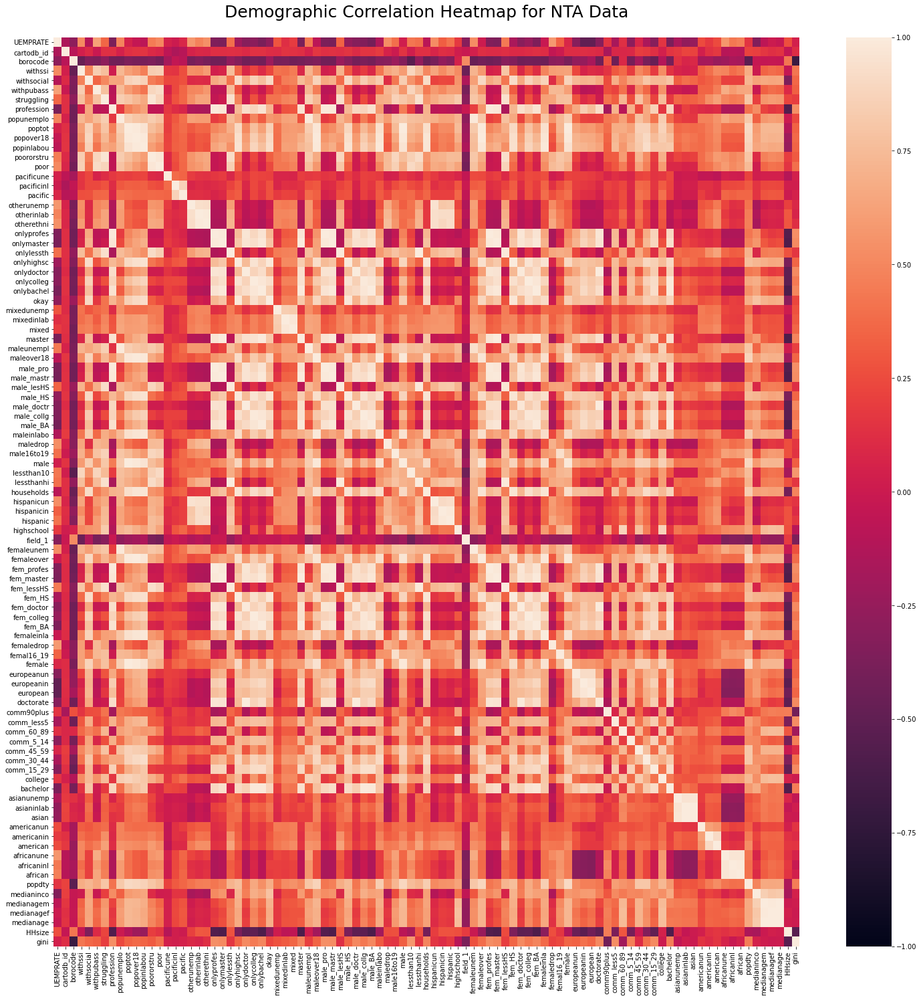

In [15]:
# Plot the correlation heatmap of NTA data

plt.figure(figsize=(25, 25))
heatmap = sns.heatmap(NTA.corr(), vmin=-1, vmax=1)
heatmap.set_title('Demographic Correlation Heatmap for NTA Data', fontdict={'fontsize':25}, pad=30);

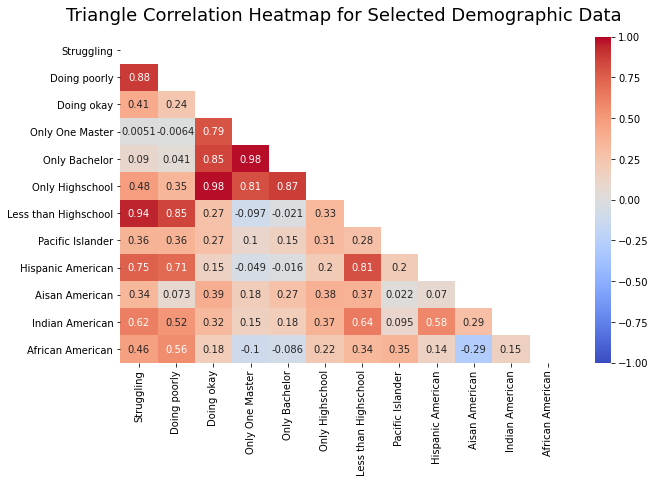

In [16]:
# Select certain columns to plot a more detailed heatmap

small_heatmap = NTA[['struggling','poor','okay','onlymaster','onlybachel','onlyhighsc','onlylessth','pacific', 'hispanic','asian','american','african']]

small_heatmap = small_heatmap.rename(columns={'poor': 'Doing poorly', 'struggling': 'Struggling','okay': 'Doing okay', 
                                             'onlymaster': 'Only One Master','onlybachel': 'Only Bachelor','onlyhighsc':'Only Highschool', 'onlylessth':'Less than Highschool',
                                             'pacific': 'Pacific Islander', 'hispanic':'Hispanic American','asian':'Aisan American','american':'Indian American','african':'African American'})
plt.figure(figsize=(10,6))
mask = np.triu(np.ones_like(small_heatmap.corr()))
small_heatmap = sns.heatmap(small_heatmap.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
small_heatmap.set_title('Triangle Correlation Heatmap for Selected Demographic Data', fontdict={'fontsize':18}, pad=16); 

## 2. Visualizing Airbnb Data at NTA and Borough Level<a class="anchor" id="2_Visualizing"></a>

In this section, we categorize the average price, the number of airbnb reviews and the average airbnb score by five Boroughs and count the number of airbnb in each Borough. The bar charts below depict the distribution of these four variables across different Boroughs, while the maps provide a general visualization of the Airbnb Data in New York City. 

In [17]:
# Group Airbnb_NTA dataset by Borough 

df1 = df[['price','review_scores_rating','geometry','neighbourhood_group_cleansed']]
df1 = df1.dissolve(by='neighbourhood_group_cleansed', aggfunc='mean')
df2 = df.pivot_table(
    ['number_of_reviews'],
    ['neighbourhood_group_cleansed'],
    aggfunc=np.sum)
df2 = pd.merge(df1, df2, on='neighbourhood_group_cleansed')
df3 = df.groupby(['neighbourhood_group_cleansed']).size().reset_index(name='counts')

boroname = pd.merge(df2, df3, on='neighbourhood_group_cleansed')
borough = boroname.rename(columns={'neighbourhood_group_cleansed': 'Borough', 'number_of_reviews': 'Total Number of Reviews', 
                                  'price': 'Average Price', 'review_scores_rating': 'Average Review Score Rating', 'counts': 'Total Number of Airbnb','geometry':'geometry'})

borough = borough[['Borough','Total Number of Airbnb', 'Average Price','Total Number of Reviews', 'Average Review Score Rating']]

#borough=borough.set_index('Borough')
borough.style.hide_index()

Borough,Total Number of Airbnb,Average Price,Total Number of Reviews,Average Review Score Rating
Bronx,194,92.932990,7665,4.697526
Brooklyn,2091,126.954567,88958,4.716475
Manhattan,1641,151.929311,58676,4.696027
Queens,631,100.450079,24681,4.729794
Staten Island,86,105.674419,4639,4.774535


In [26]:
# Display Airbnb data in bar charts

fig = make_subplots(rows=2, cols=2, subplot_titles=('Total Number of Airbnb','Average Price',
                                                    'Total Number of Reviews','Average Review Score Rating'))

fig.add_trace(go.Bar(
    name="Number of Airbnb",
    x=borough['Borough'],
    y=borough['Total Number of Airbnb']),
              row=1, col=1)

fig.add_trace(go.Bar(
            name="Average Price",
            x=borough["Borough"],
            y=borough["Average Price"],
            offsetgroup=0,
        ),
        row=1, col=2
)
fig.add_trace(go.Bar(
            name="Number of Reviews",
            x=borough["Borough"],
            y=borough["Total Number of Reviews"],
            offsetgroup=1,
        ),
        row=2, col=1
)
fig.add_trace(go.Bar(
            name="Average Review Score Rating",
            x=borough["Borough"],
            y=borough["Average Review Score Rating"],
            offsetgroup=2,),
            row=2, col=2)

fig.update_layout(title_text="Airbnb Data Among Different NYC Boroughs")
fig.show()

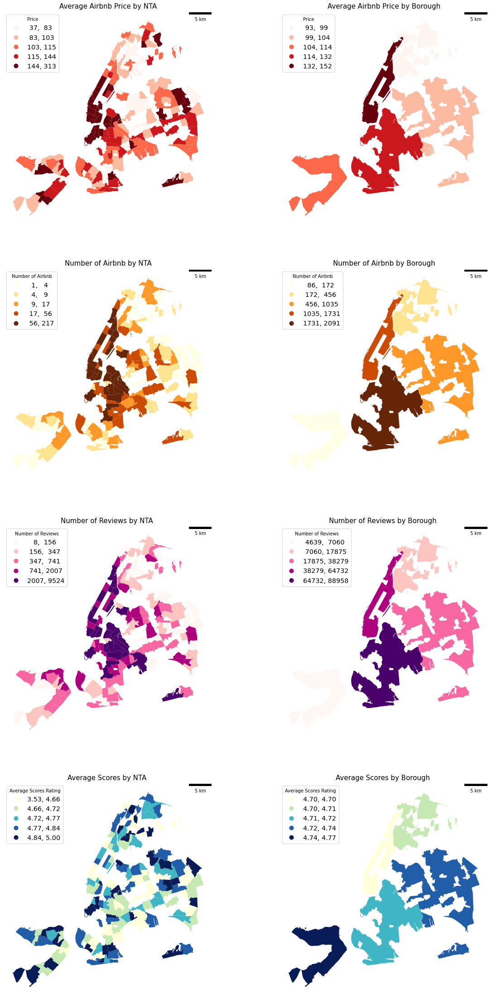

In [19]:
# Select required columns to generate new dataframe for further analysis
df3 = df[['price','review_scores_rating','geometry','ntaname']]
df3 = df3.dissolve(by='ntaname', aggfunc='mean')
df4 = df.pivot_table(
    ['number_of_reviews'],
    ['ntaname'],
    aggfunc=np.sum)
df4 = pd.merge(df3, df4, on='ntaname')
df5 = df.groupby(['ntaname']).size().reset_index(name='counts')
ntaname = pd.merge(df4, df5, on='ntaname') #groupby airbnb data by Neighborhood Tabulation Area 

df6 = df[['price','review_scores_rating','geometry','neighbourhood_group_cleansed']]
df6 = df6.dissolve(by='neighbourhood_group_cleansed', aggfunc='mean')
df7 = df.pivot_table(
    ['number_of_reviews'],
    ['neighbourhood_group_cleansed'],
    aggfunc=np.sum)
df7 = pd.merge(df6, df7, on='neighbourhood_group_cleansed')
df8 = df.groupby(['neighbourhood_group_cleansed']).size().reset_index(name='counts')
boroname = pd.merge(df7, df8, on='neighbourhood_group_cleansed') #groupby airbnb data by Borough


# Plot Airbnb data by NTA and Borough
fig, [[ax1, ax2],[ax3, ax4],[ax5, ax6],[ax7, ax8]] = plt.subplots(4, 2,figsize=(20, 40))


# Characterized by average Aibnb price
price_nta_plot = ntaname.plot(column="price",legend=True,ax=ax1,cmap='Reds',scheme='quantiles', 
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Price", 
                              fontsize = 'x-large',frameon=True))
price_nta_plot.add_artist(ScaleBar(1))
price_nta_plot.set_title("Average Airbnb Price by NTA", fontsize=15)

price_boro_plot = boroname.plot(column="price",legend=True,ax=ax2,cmap='Reds',scheme='quantiles', 
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Price", 
                              fontsize = 'x-large',frameon=True))
price_boro_plot.add_artist(ScaleBar(1))
price_boro_plot.set_title("Average Airbnb Price by Borough", fontsize=15)


# Characterized by total number of Airbnb
count_nta_plot = ntaname.plot(column="counts",legend=True,ax=ax3,cmap='YlOrBr',scheme='quantiles',
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Number of Airbnb", 
                              fontsize = 'x-large', frameon=True))
count_nta_plot.add_artist(ScaleBar(1))
count_nta_plot.set_title("Number of Airbnb by NTA", fontsize=15)

count_boro_plot = boroname.plot(column="counts",legend=True,ax=ax4,cmap='YlOrBr',scheme='quantiles',
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Number of Airbnb", 
                              fontsize = 'x-large', frameon=True))
count_boro_plot.add_artist(ScaleBar(1))
count_boro_plot.set_title("Number of Airbnb by Borough", fontsize=15)


# Characterized by total number of reviews of Airbnb
review_nta_plot = ntaname.plot(column="number_of_reviews",legend=True,ax=ax5,cmap='RdPu',scheme='quantiles',
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Number of Reviews", 
                              fontsize = 'x-large', frameon=True))
review_nta_plot.add_artist(ScaleBar(1))
review_nta_plot.set_title("Number of Reviews by NTA ", fontsize=15)

review_boro_plot = boroname.plot(column="number_of_reviews",legend=True,ax=ax6,cmap='RdPu',scheme='quantiles',
             legend_kwds=dict(loc='upper left', fmt= "{:.0f}", title="Number of Reviews", 
                              fontsize = 'x-large', frameon=True))
review_boro_plot.add_artist(ScaleBar(1))
review_boro_plot.set_title("Number of Reviews by Borough ", fontsize=15)


# Characterized by average score of Airbnb
score_nta_plot = ntaname.plot(column="review_scores_rating",legend=True,ax=ax7,cmap='YlGnBu',scheme='quantiles',
             legend_kwds=dict(loc='upper left', title="Average Scores Rating", 
                              fontsize = 'x-large',frameon=True))
score_nta_plot.add_artist(ScaleBar(1))
score_nta_plot.set_title("Average Scores by NTA ", fontsize=15)

score_boro_plot = boroname.plot(column="review_scores_rating",legend=True,ax=ax8,cmap='YlGnBu',scheme='quantiles',
             legend_kwds=dict(loc='upper left', title="Average Scores Rating", 
                              fontsize = 'x-large',frameon=True))
score_boro_plot.add_artist(ScaleBar(1))
score_boro_plot.set_title("Average Scores by Borough ", fontsize=15)


for ax in (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8):
    ax.set_axis_off()

* Average Airbnb Price in NYC

Beyond all doubts, Manhattan, the world's supremest financial and commercial center lists as the most expansive borough in New York City. The average Airbnb price in Manhattan exceeds 130 dollars per day, while almost every NTA in Manhattan marks as dark brown (over 140 dollars per day). Interestingly, Brooklyn has the second-highest average Airbnb price. This is partly due to Brooklyn being a diverse borough. The areas near Manhattan have higher Airbnb prices, whereas the areas in the southern part have lower prices. Staten Island and Queens rank as the third and fourth in terms of average Airbnb price. However, there are some exceptional NTAs which has a higher price. For example, Todt Hill in Staten Island is famous for its affluent neighborhood. Its high Airbnb price is also partly because it is the highest natural point in NYC, at roughly 400 feet above sea level, which provides breathtaking ocean vistas from homes. Bayside in Queens has also separated itself from other nearby neighbors as this area is well known for its suburb enclaves. 

* Number of Airbnb in NYC

According to these two maps, the distribution of Airbnb in New York City has large disparities among different boroughs. Airbnbs in NYC mainly concentrates in the downtown areas. Without doubts, Manhattan and Brooklyn have the highest number of Airbnbs. Both boroughs have over 1000 Airbnb available. One possible reason for these high numbers of Airbnb is that most Airbnbs are booked by tourists. While these two boroughs get the major attractions, museums, and theatres in NYC. Whereas, Staten Island, is quite far away from the city center and is the only borough that is not linked with any subway. Thus, it is reasonable to see single-digit Airbnbs in Staten Island's neighborhood areas. Other areas which have less Airbnbs are the eastern part of Queens and Bronx. These parts are all far away from the city center. 

* Number of Airbnb Reviews in NYC

These two maps are quite similar to the former Number of Airbnb Map, which proves Manhattan and Brooklyn as the most popular boroughs. Brooklyn gets a total of 90,000 reviews which is ten times larger than Staten Island. We can also see that areas around the city center are mostly welcomed. The western neighbourhood areas in Queens and Bronx also received thousands of reviews. Therefore, it is easy to speculate that downtown is most preferable for Airbnb users. 

* Average Airbnb Score in NYC

The average review score map presents a different story. Manhattan and Brooklyn are no longer the leading boroughs in this category. On the other hand, Staten Island and Queens have the best review score. One reason may be these two areas have fewer Airbnbs, which means they have less chance to receive lower scores. The other reason maybe because they are far away from the city center. Therefore these areas are less noisy and messy. However, the gaps between scores are quite small. So it is too early to draw any conclusions. 

Overall, these choropleth maps provide us a general picture of Airbnbs in New York City on their prices, numbers, and reviews. The visualizations are also supported by our common sense. For example, the city center is the most popular area for Airbnb and therefore, has the highest house price. 

## 3. Visualizing the relationship between Airbnb variables and demographic variables<a class="anchor" id="3_Visualizing"></a>

In this section, I explore whether the distribution of Airbnbs is related to demographic data. This is achieved by examining the correlations between "price," "number of reviews," and "counts" and all demographic characteristics.

With 95 demographic features, it is unrealistic to visualize them all. Therefore, I choose to visualize the variables with the highest correlation with "price," "number of reviews," and "counts," respectively. The variables I selected are the population with education attainment of a professional degree level ("profession") and the number of workers who commute 30 to 44 minutes to work ("comm_30_44"). The price variable has the highest correlation with "profession," whereas both "number of reviews" and "counts" have the highest correlation with "comm_30_44."

In [20]:
# Group NTA dataset by ntaname and combine it with ntaname dataset, name the new dateframe 'df_nta'
df_nta=pd.merge(NTA,ntaname,on='ntaname')

# Calculate the correlation between variables in df_nta
df_corr=df_nta.corr()
df_corr=df_corr[['price','number_of_reviews','counts']]
df_corr

,price,number_of_reviews,counts
UEMPRATE,-0.358264,0.014199,-0.044651
cartodb_id,0.067850,0.067361,0.083868
borocode,-0.191225,-0.258665,-0.319485
withssi,-0.125771,0.413628,0.394887
withsocial,0.199046,0.355221,0.417570
...,...,...,...
gini,0.280074,0.362267,0.415898
price,1.000000,0.242029,0.266160
review_scores_rating,0.081558,-0.034113,-0.061326
number_of_reviews,0.242029,1.000000,0.964738


In [21]:
# Sort the correlations by "price","number of reviews" and "number of airbnbs" respectively
print("The highest correlation for price \n", df_corr['price'].nlargest(3))
print("The highest correlation for the number of reviews \n", df_corr['number_of_reviews'].nlargest(3))
print("The highest correlation for the number of airbnbs \n", df_corr['counts'].nlargest(3))

The highest correlation for price 
 price         1.000000
male_BA       0.427374
profession    0.425492
Name: price, dtype: float64
The highest correlation for the number of reviews 
 number_of_reviews    1.000000
counts               0.964738
comm_30_44           0.565174
Name: number_of_reviews, dtype: float64
The highest correlation for the number of airbnbs 
 counts               1.000000
number_of_reviews    0.964738
comm_30_44           0.636932
Name: counts, dtype: float64


In [22]:
# Convert the variables into log scale
df_nta['lnprice']=np.log(df_nta['price'])
df_nta['lnreviews']=np.log(df_nta['number_of_reviews'])
df_nta['lnprofession']=np.log(df_nta['profession'])
df_nta['lncomm_30_44']=np.log(df_nta['comm_30_44'])
df_nta['lncounts']=np.log(df_nta['counts'])

I use joint plots to display both the histogram and scatter diagram. For better visualization, I shift all variables into a log scale. All three figures clearly demonstrate the existence of highly positive associations. Regarding the histograms, I observe that the price variable looks like a normal distribution, while the "profession" variables and "comm_30_44" have very few extreme values. However, the distribution of the number of Airbnbs is relatively even in all intervals.

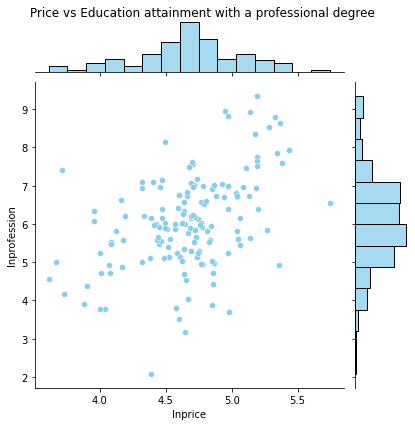

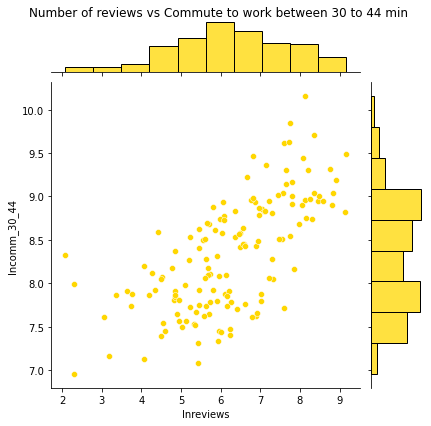

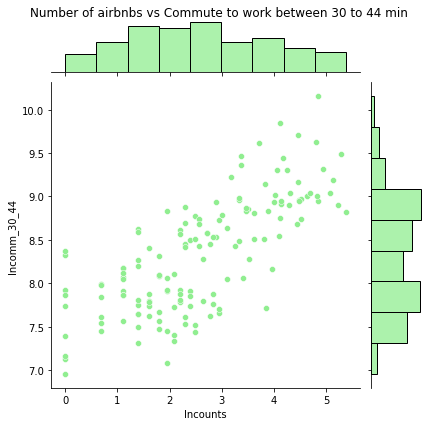

In [27]:
# Visualize the relationships with highest correlation values by joinplot 

f1=sns.jointplot(x=df_nta['lnprice'],y=df_nta['lnprofession'],color='skyblue')
f2=sns.jointplot(x=df_nta['lnreviews'],y=df_nta['lncomm_30_44'],color='gold')
f3=sns.jointplot(x=df_nta['lncounts'],y=df_nta['lncomm_30_44'],color='lightgreen')

f1.fig.suptitle("Price vs Education attainment with a professional degree")
f2.fig.suptitle("Number of reviews vs Commute to work between 30 to 44 min")
f3.fig.suptitle("Number of airbnbs vs Commute to work between 30 to 44 min")

f1.fig.subplots_adjust(top=0.95)
f2.fig.subplots_adjust(top=0.95)
f3.fig.subplots_adjust(top=0.95)

# VI. PCA<a class="anchor" id="PCA"></a>

The purpose of using PCA is to reduce the dimensionality of a data set with numerious variables by transforming them into lower dimensions while still preserving the information of the huge data set, therefore people can visualize it by their eyes.

## 1. Dimension Reduction for Demographic Data across Different Boroughs<a class="anchor" id="1_PCA_Demographic_Data_across_different_Borough"></a> 

In the first part of this section, I aim to explore the spatial relationship between demographic features and different boroughs. In other words, I want to investigate whether the points from the same borough can be well-clustered in the scatter diagram. If this is the case, it suggests that their demographic features are correlated within the same borough.

The results show that Bronx, Queens, and Staten Island indeed present a well cluster, whereas the other two boroughs do not. However, all types of boroughs do not cluster separately, implying that the demographic features are also significantly connected across different boroughs. 

In [28]:
# Select all demographic features
features=['UEMPRATE','withssi', 'withsocial',
       'withpubass', 'struggling', 'profession', 'popunemplo', 'poptot',
       'popover18', 'popinlabou', 'poororstru', 'poor', 'pacificune',
       'pacificinl', 'pacific', 'otherunemp', 'otherinlab', 'otherethni',
       'onlyprofes', 'onlymaster', 'onlylessth', 'onlyhighsc', 'onlydoctor',
       'onlycolleg', 'onlybachel', 'okay', 'mixedunemp', 'mixedinlab', 'mixed',
       'master', 'maleunempl', 'maleover18', 'male_pro', 'male_mastr',
       'male_lesHS', 'male_HS', 'male_doctr', 'male_collg', 'male_BA',
       'maleinlabo', 'maledrop', 'male16to19', 'male', 'lessthan10',
       'lessthanhi', 'households', 'hispanicun', 'hispanicin', 'hispanic',
       'highschool', 'field_1', 'femaleunem', 'femaleover', 'fem_profes',
       'fem_master', 'fem_lessHS', 'fem_HS', 'fem_doctor', 'fem_colleg',
       'fem_BA', 'femaleinla', 'femaledrop', 'femal16_19', 'female',
       'europeanun', 'europeanin', 'european', 'doctorate', 'comm90plus',
       'comm_less5', 'comm_60_89', 'comm_5_14', 'comm_45_59', 'comm_30_44',
       'comm_15_29', 'college', 'bachelor', 'asianunemp', 'asianinlab',
       'asian', 'americanun', 'americanin', 'american', 'africanune',
       'africaninl', 'african','popdty', 
       'medianinco', 'medianagem', 'medianagef', 'medianage', 'HHsize', 'gini']

# Separating the numeric
x = NTA.loc[:, features].values
# Separating out the target
y = NTA.loc[:,['boroname']].values
# Standardizing the features
x = StandardScaler().fit_transform(x)

# Dimensions reduction by PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
Y = pca.fit_transform(x)

principalDf = pd.DataFrame(data = Y
             , columns = ['principal component 1', 'principal component 2'])
df_boroname=NTA[['boroname']].reset_index()
finalDf = pd.concat([principalDf, df_boroname], axis = 1)

# Scatter plot the 2-dimensional PCA demographic features grouped by borough
import plotly.express as px
fig = px.scatter(Y, x=finalDf['principal component 1'], y=finalDf['principal component 2'], 
                 symbol=finalDf['boroname'],color=finalDf['boroname'], size_max=1)

fig.update_layout(title_text="Dimension Reduction Demographic Data across Different Boroughs")
fig.show()

## 2. Dimension Reduction for Airbnb Data across Different Boroughs<a class="anchor" id="2_PCA_Airbnb_Data_among_different_Borough"></a> 

This PCA analysis aims to visualize the large Airbnb data frame. However, as the graph shows, the cells are not clearly separated. In other words, we cannot distinguish the Airbnbs in New York City clearly by their features. Most of the cells cluster with each other, indicating a high degree of correlation.

One possible reason might be that we have dropped the outliers in the Airbnb data. Thus, some important values that could have differentiated these houses have been excluded. Another reason might be due to the similarity of Airbnbs across different boroughs. For example, they have similar bedrooms, accommodates, etc. Therefore, the Airbnbs in New York City are generally similar to each other.

In [31]:
# Select features of airbnb

PCA_airbnb = df[['price','number_of_reviews','accommodates','bedrooms','beds','minimum_nights','maximum_nights',
                 'maximum_minimum_nights','availability_30', 'availability_60', 'availability_90','availability_365',
                 'number_of_reviews_ltm', 'number_of_reviews_l30d',
                 'neighbourhood_group_cleansed']]

PCA_airbnb = PCA_airbnb.drop_duplicates()



X = PCA_airbnb[['price','number_of_reviews','accommodates','bedrooms','beds','minimum_nights','maximum_nights',
                'maximum_minimum_nights','availability_30', 'availability_60', 'availability_90','availability_365',
                 'number_of_reviews_ltm', 'number_of_reviews_l30d']]

# Standardize the data
X = StandardScaler().fit_transform(X)

# Dimensions reduction by PCA 
pca = PCA(n_components=2)
components = pca.fit_transform(X)

# Scatter plot the 2-dimensional PCA of airbnb features grouped by borough
fig = px.scatter(components, x=0, y=1, color=PCA_airbnb['neighbourhood_group_cleansed'],
                 symbol=PCA_airbnb['neighbourhood_group_cleansed'],size_max=1)
fig.update_layout(title_text="Dimension reduction for Airbnb Data across Different Boroughs")

fig.show()

# VII. Conclusion<a class="anchor" id="Conclusion"></a>

In conclusion, this project presents a comprehensive overview of Airbnb in New York City concerning neighborhoods. I merge the "new" type of Airbnb data with traditional census bureau data to visualize the Airbnb and demographic information in New York City. As the Airbnb data is automatically generated from our digital life, it makes every host and guest a contributor to my study. Despite the dataset containing some extreme values and outliers, it is quite up-to-date and presents a fair picture of New York City's Airbnbs.

After combining the Airbnb data with the NTA Demographic data, I visualize Airbnbs geographically and gain a deeper understanding of their distribution in NTAs and boroughs. From the maps and joint plots of commuting time, it is obvious to see that Airbnbs are more likely to be located at the city center, while guests also prefer downtown areas as their accommodations.

However, when attempting to reduce the dimensions of the variables, the cells cannot separate according to target groups. In other words, people's preferences in choosing Airbnb are based on its location rather than Airbnb's internal characteristics (such as 'beds', 'minimum nights').

Therefore, I can argue that location is the main selection criterion when people book Airbnbs in New York City.

# VIII. Appendix<a class="anchor" id="Appendix"></a> 

The description of the meanings for all variables can be found from the links below:

* Airbnb data: https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=982310896
* NTA data: https://geodacenter.github.io/data-and-lab/nyc/ 